## Improving SIRENs for Image Representation: Learning Rate Scheduling, Shortcut Connections, and Self-Attention

---
- Baseline Code Link: https://github.com/vsitzmann/siren

### 1. Import and GPU Setting

In [1]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

In [2]:
# use GPU
device = torch.device("mps") if torch.backends.mps.is_available() else "cpu"
print(f"device: {device}")

device: mps


### 2. Generate Coordinate Grids

In [3]:
def get_mgrid(sidelen, dim=2):
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

### 3. Building Block of SIREN

In [4]:
class SineLayer(nn.Module):
    
    def __init__(self, in_features, out_features, bias=True,
                 is_first=False, omega_0=30):
        super().__init__()
        self.omega_0 = omega_0
        self.is_first = is_first
        
        self.in_features = in_features
        self.linear = nn.Linear(in_features, out_features, bias=bias)
        
        self.init_weights()
    
    def init_weights(self):
        with torch.no_grad():
            if self.is_first:
                self.linear.weight.uniform_(-1 / self.in_features, 
                                             1 / self.in_features)      
            else:
                self.linear.weight.uniform_(-np.sqrt(6 / self.in_features) / self.omega_0, 
                                             np.sqrt(6 / self.in_features) / self.omega_0)
        
    def forward(self, input):
        return torch.sin(self.omega_0 * self.linear(input))

In [5]:
class Siren(nn.Module):
    
    def __init__(self, in_features, hidden_features, hidden_layers, out_features, outermost_linear=False, 
                 first_omega_0=30, hidden_omega_0=30.):
        super().__init__()
        
        self.net = []
        self.net.append(SineLayer(in_features, hidden_features, 
                                  is_first=True, omega_0=first_omega_0))

        for i in range(hidden_layers):
            self.net.append(SineLayer(hidden_features, hidden_features, 
                                      is_first=False, omega_0=hidden_omega_0))

        if outermost_linear:
            final_linear = nn.Linear(hidden_features, out_features)
            
            with torch.no_grad():
                final_linear.weight.uniform_(-np.sqrt(6 / hidden_features) / hidden_omega_0, 
                                              np.sqrt(6 / hidden_features) / hidden_omega_0)
                
            self.net.append(final_linear)
        else:
            self.net.append(SineLayer(hidden_features, out_features, 
                                      is_first=False, omega_0=hidden_omega_0))
        
        self.net = nn.Sequential(*self.net)
    
    def forward(self, coords):
        coords = coords.clone().detach().requires_grad_(True)
        output = self.net(coords)
        return output, coords

### 4. Gradients and Laplacian

In [6]:
def laplace(y, x):
    grad = gradient(y, x)
    return divergence(grad, x)


def divergence(y, x):
    div = 0.
    for i in range(y.shape[-1]):
        div += torch.autograd.grad(y[..., i], x, torch.ones_like(y[..., i]), create_graph=True)[0][..., i:i+1]
    return div


def gradient(y, x, grad_outputs=None):
    if grad_outputs is None:
        grad_outputs = torch.ones_like(y)
    grad = torch.autograd.grad(y, [x], grad_outputs=grad_outputs, create_graph=True)[0]
    return grad

### 5. Fitting an Image

In [7]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img

In [8]:
class ImageFitting(Dataset):
    
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

In [9]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

img_siren = Siren(in_features=2, out_features=1, hidden_features=256, 
                  hidden_layers=3, outermost_linear=True)
img_siren.to(device)

/Users/hayleyshin/opt/anaconda3/lib/python3.9/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)

Step 0, Total loss 0.326745


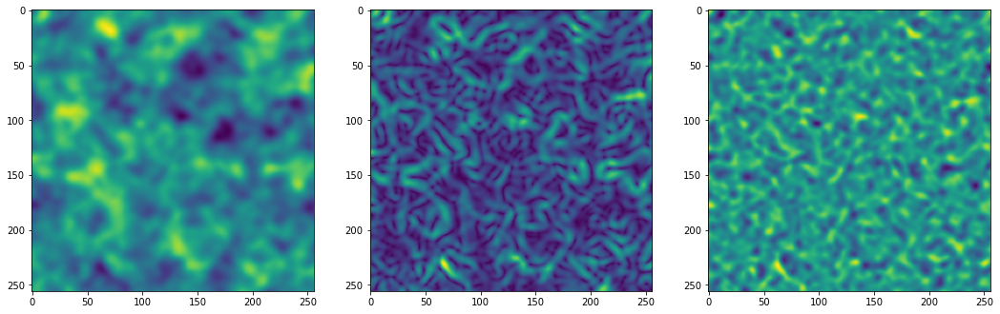

Step 10, Total loss 0.047425


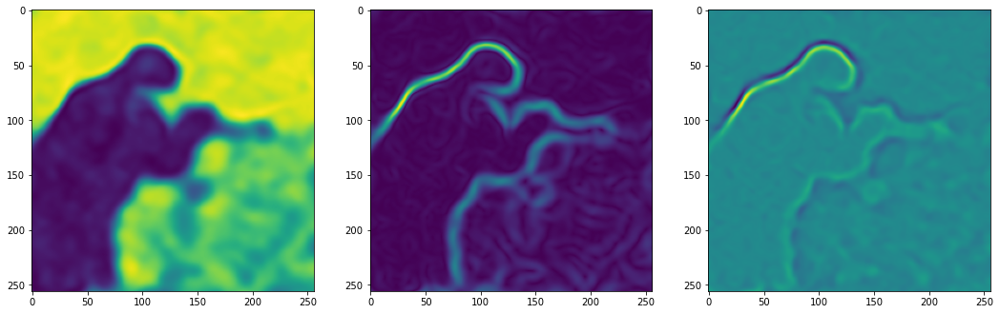

Step 20, Total loss 0.021831


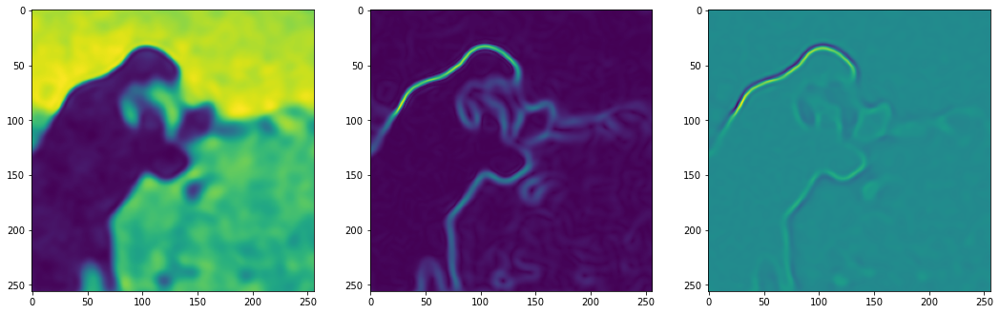

Step 30, Total loss 0.016268


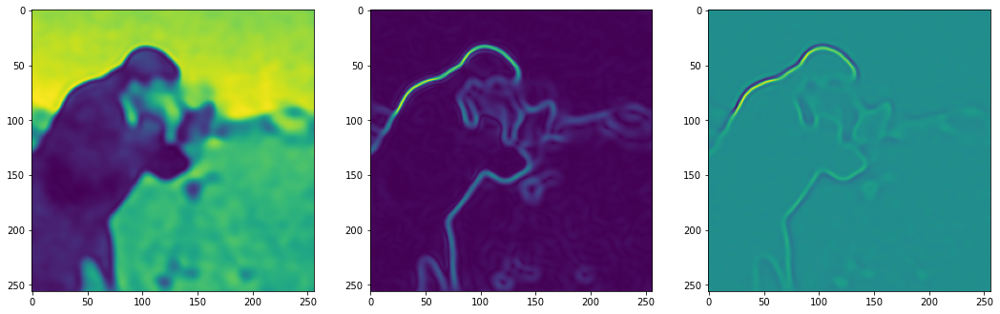

Step 40, Total loss 0.013375


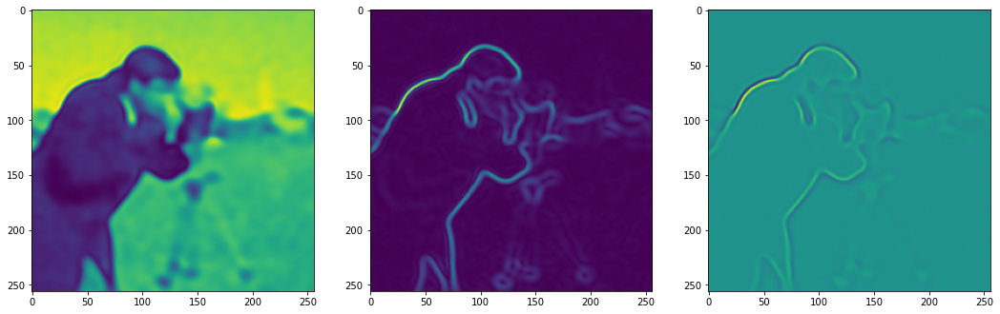

Step 50, Total loss 0.011773


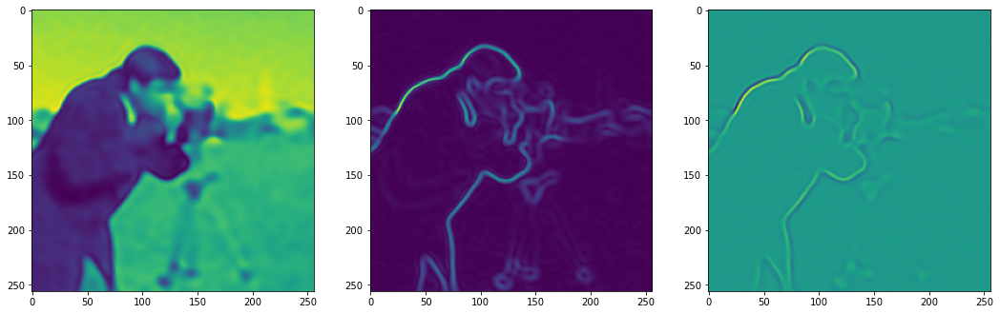

Step 60, Total loss 0.010681


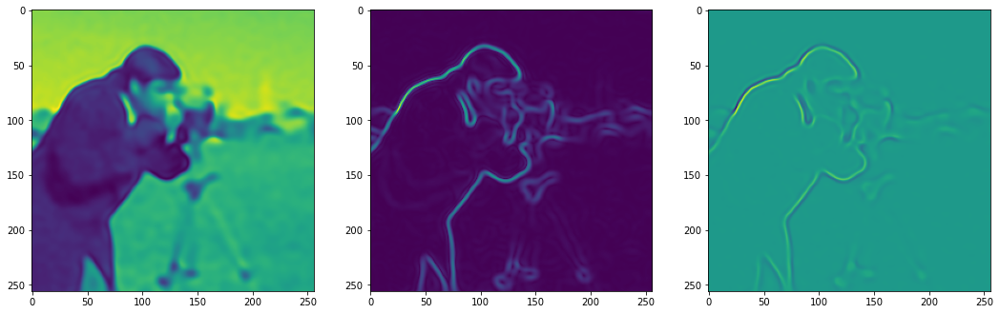

Step 70, Total loss 0.009853


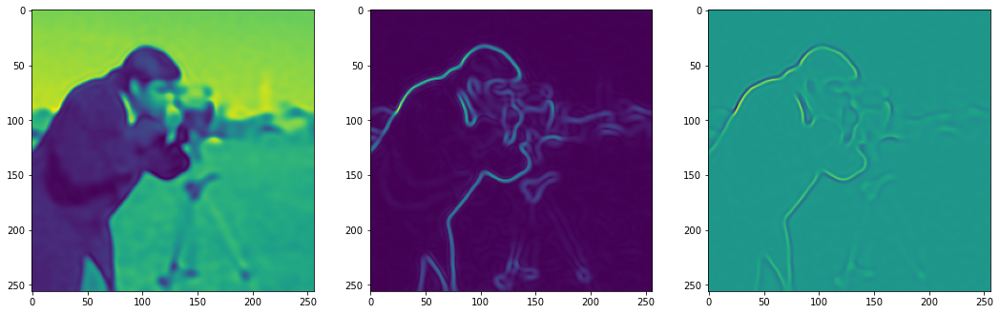

Step 80, Total loss 0.009174


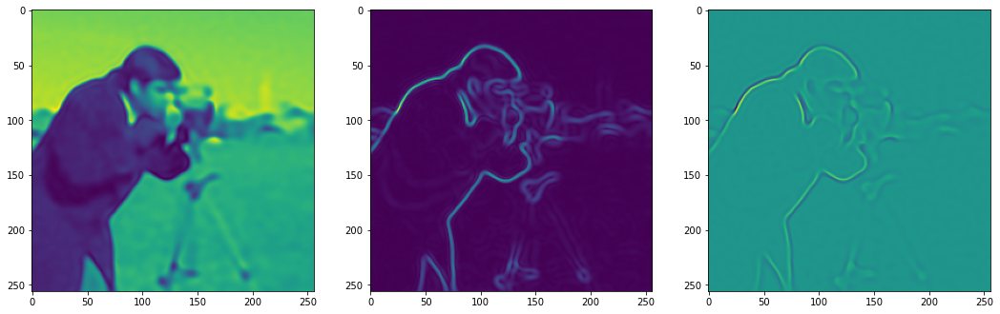

Step 90, Total loss 0.008589


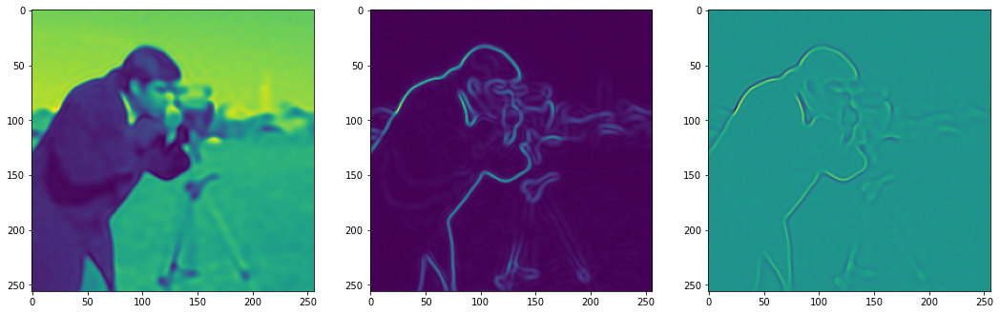

Step 100, Total loss 0.008062


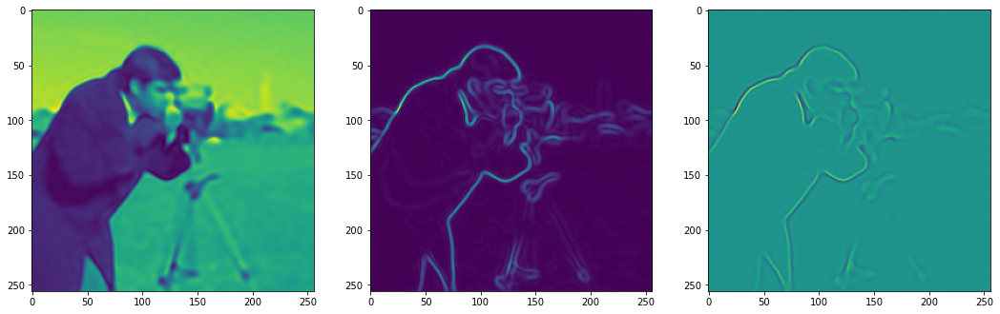

Step 110, Total loss 0.007577


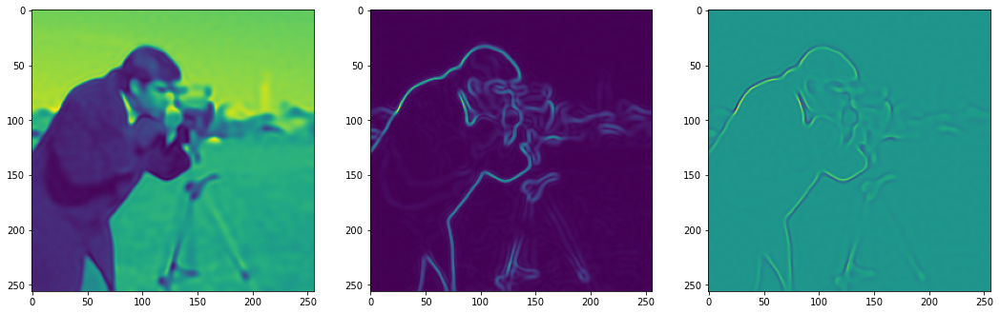

Step 120, Total loss 0.007121


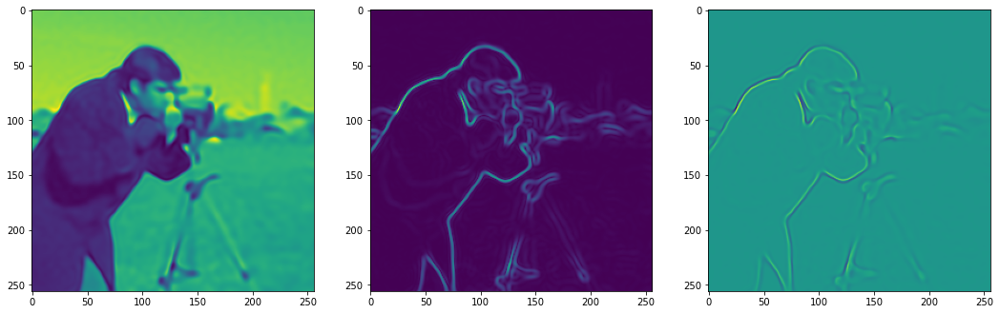

Step 130, Total loss 0.006689


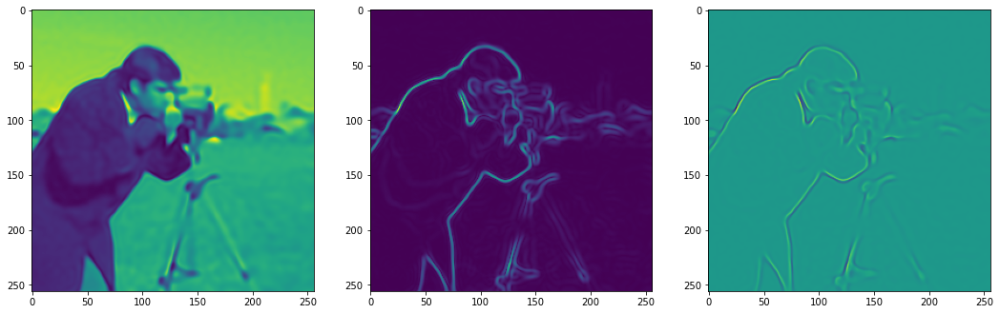

Step 140, Total loss 0.006281


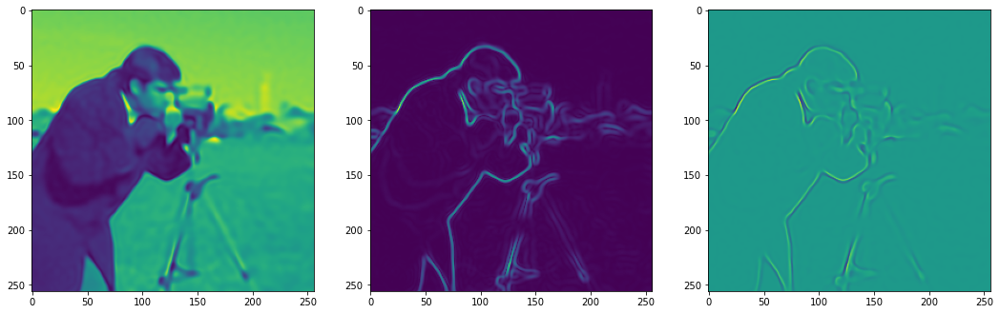

Step 150, Total loss 0.005898


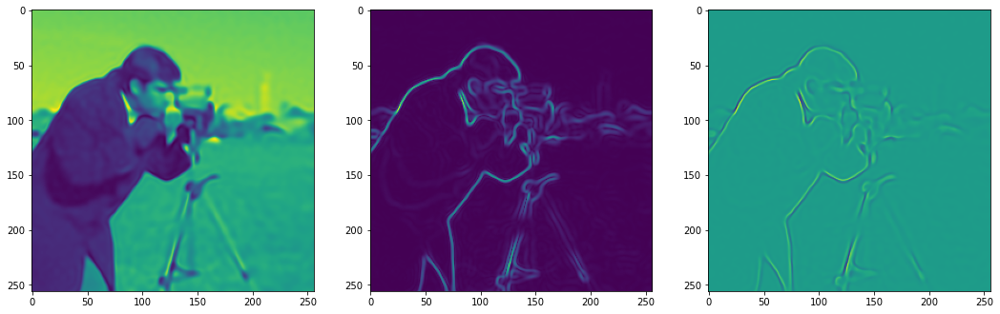

Step 160, Total loss 0.005536


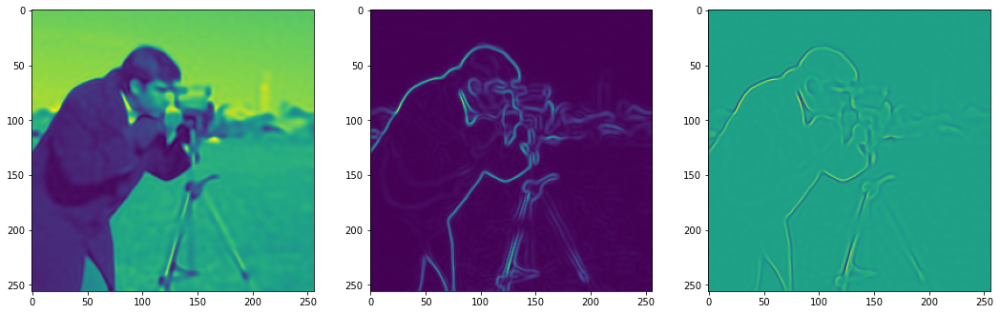

Step 170, Total loss 0.005194


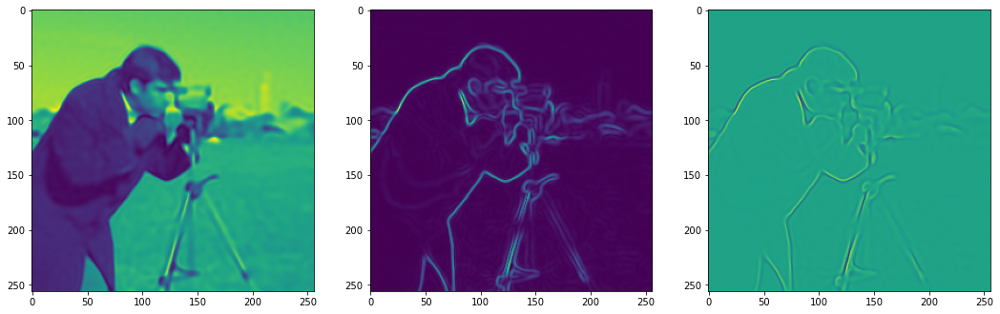

Step 180, Total loss 0.004875


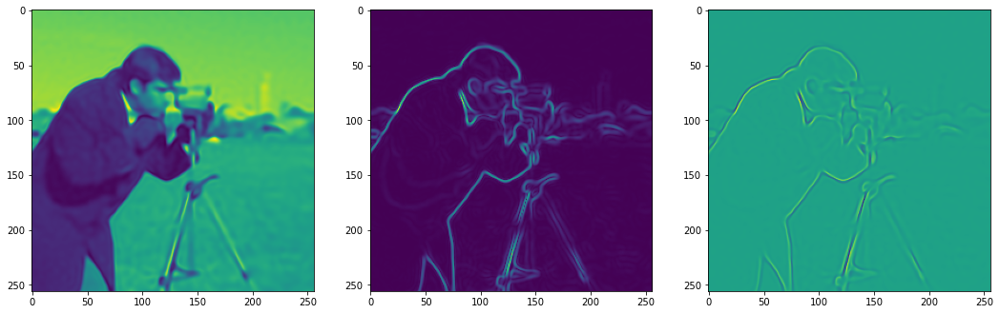

Step 190, Total loss 0.004582


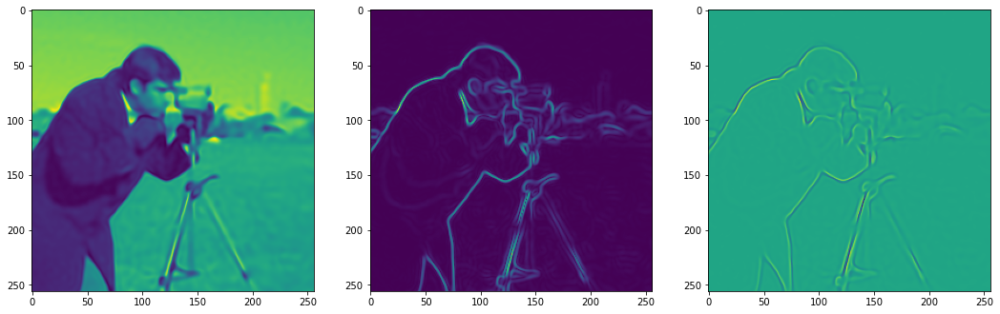

Step 200, Total loss 0.004319


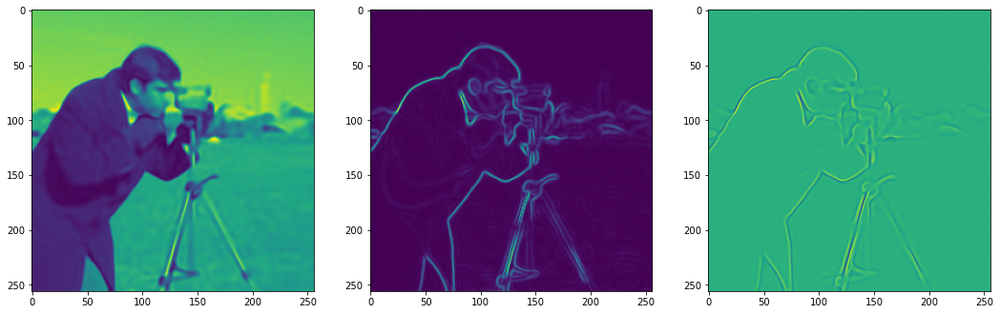

Step 210, Total loss 0.004085


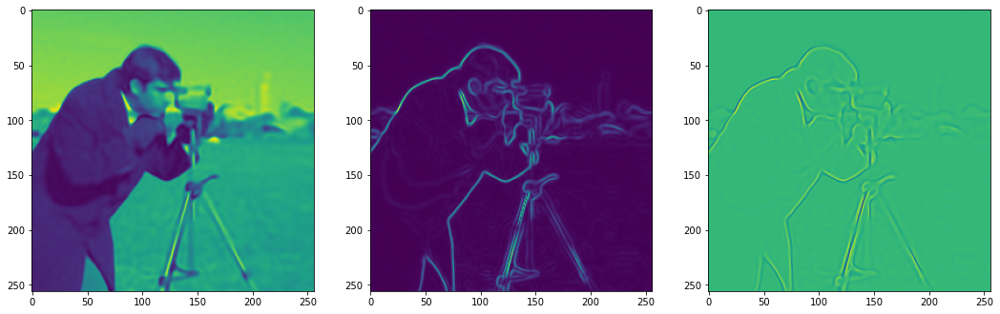

Step 220, Total loss 0.003878


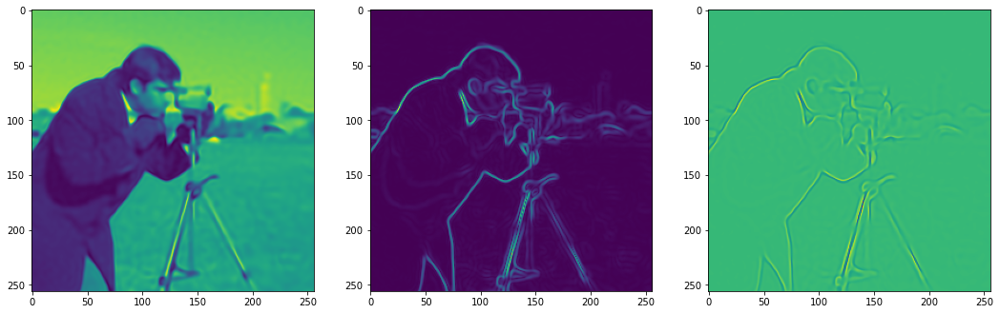

Step 230, Total loss 0.003693


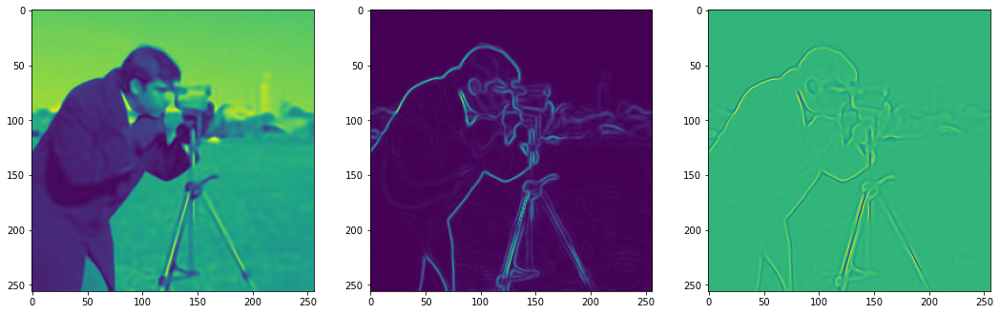

Step 240, Total loss 0.003525


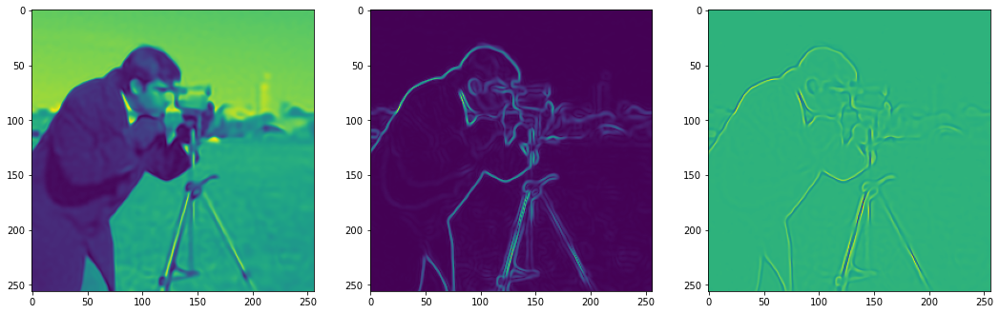

Step 250, Total loss 0.003371


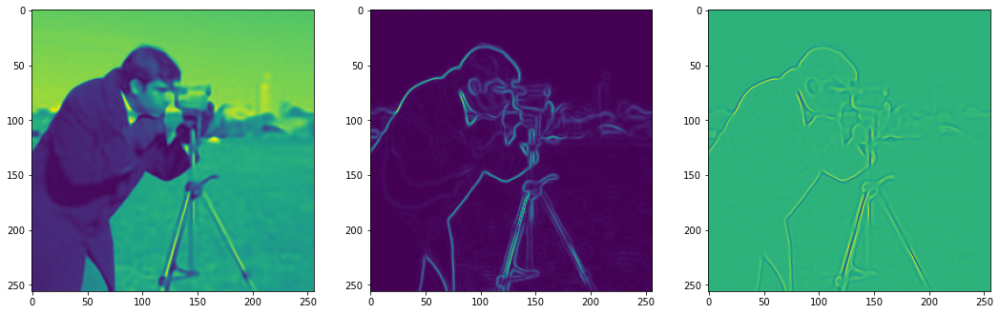

Step 260, Total loss 0.003232


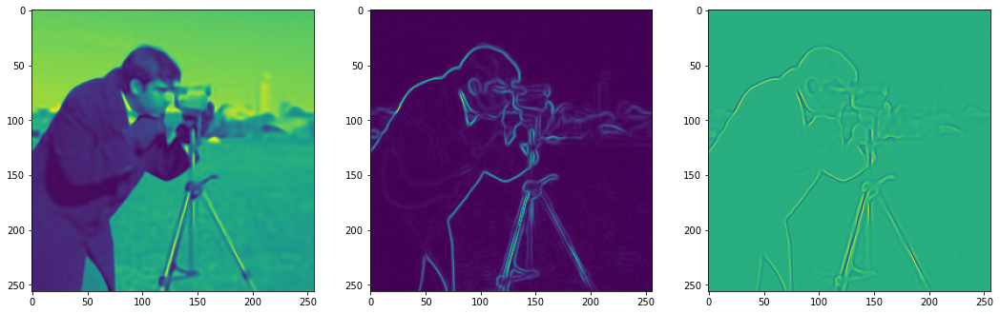

Step 270, Total loss 0.003105


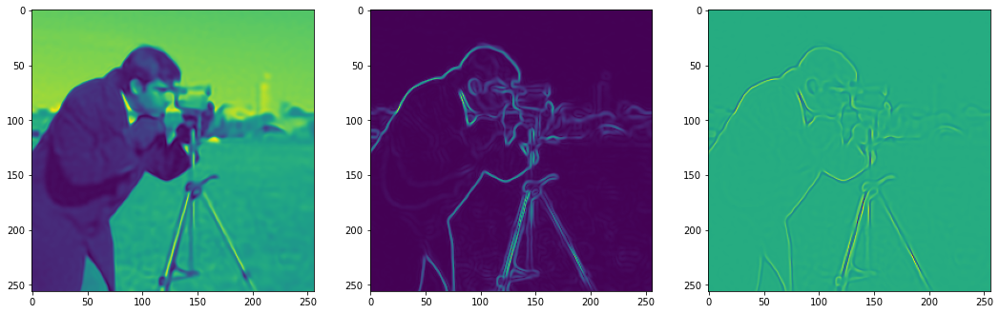

Step 280, Total loss 0.002991


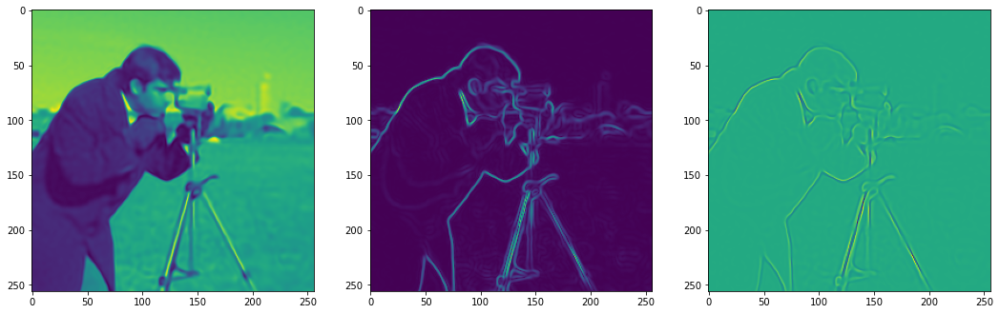

Step 290, Total loss 0.002887


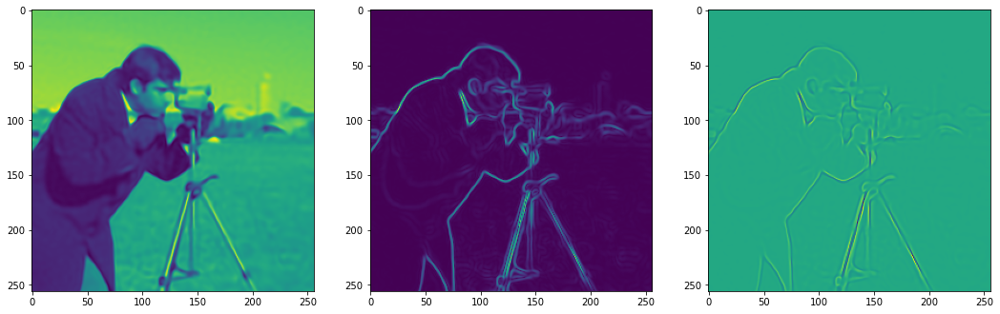

Step 300, Total loss 0.002793


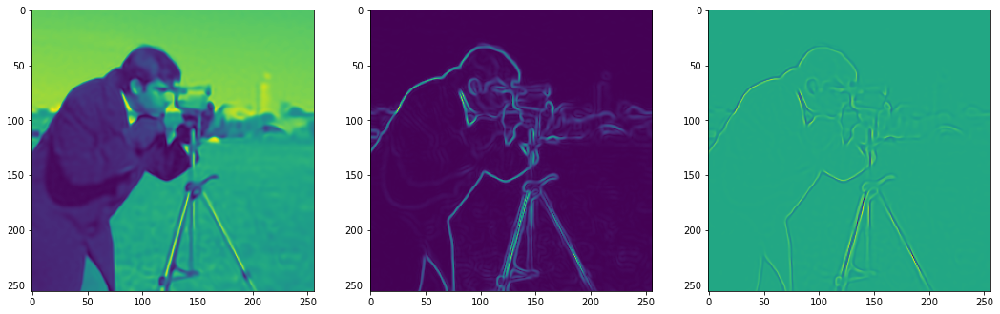

Step 310, Total loss 0.002708


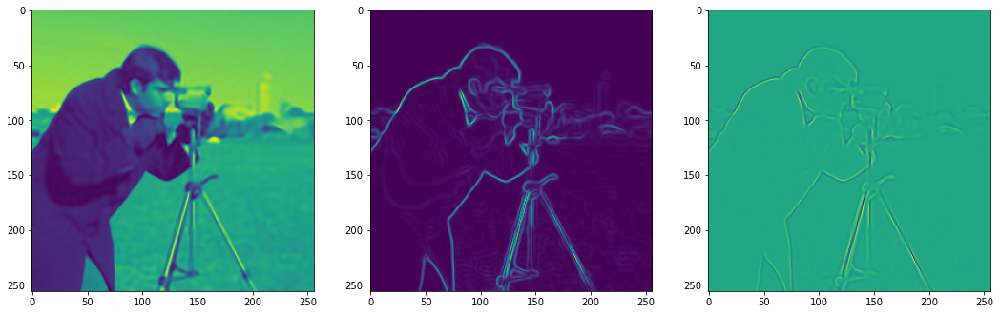

Step 320, Total loss 0.002631


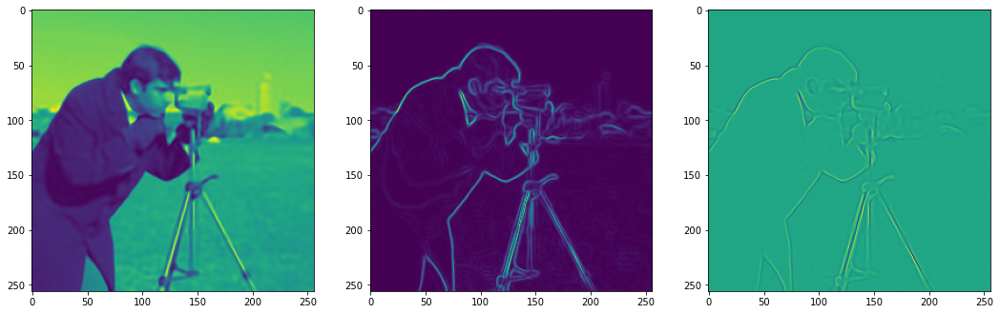

Step 330, Total loss 0.002561


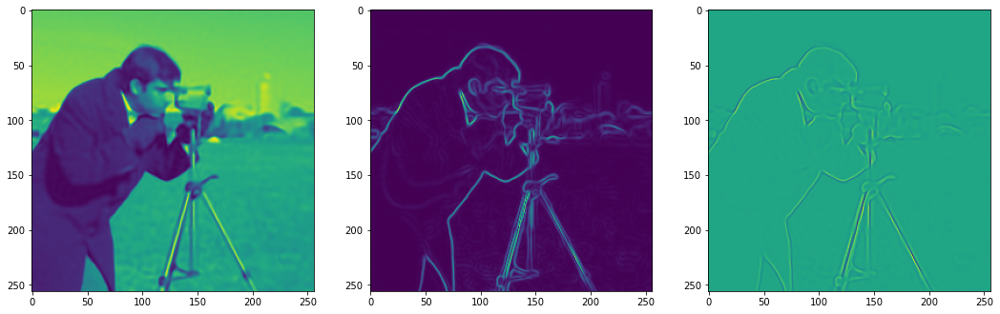

Step 340, Total loss 0.002497


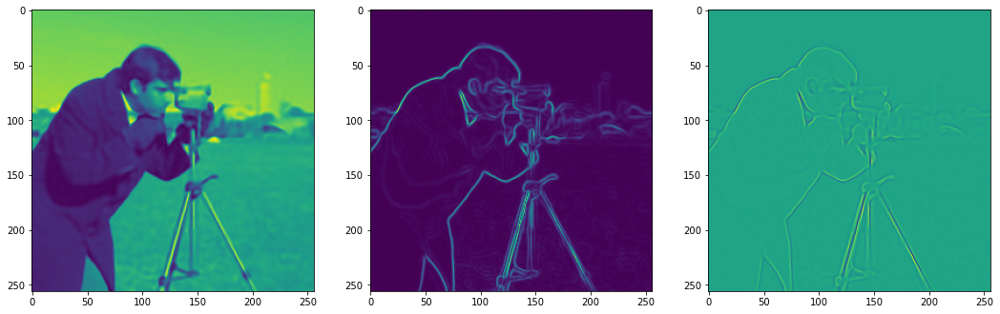

Step 350, Total loss 0.002440


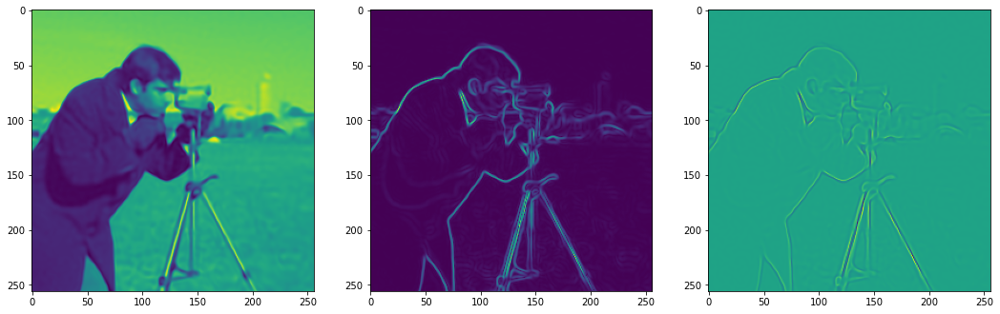

Step 360, Total loss 0.002389


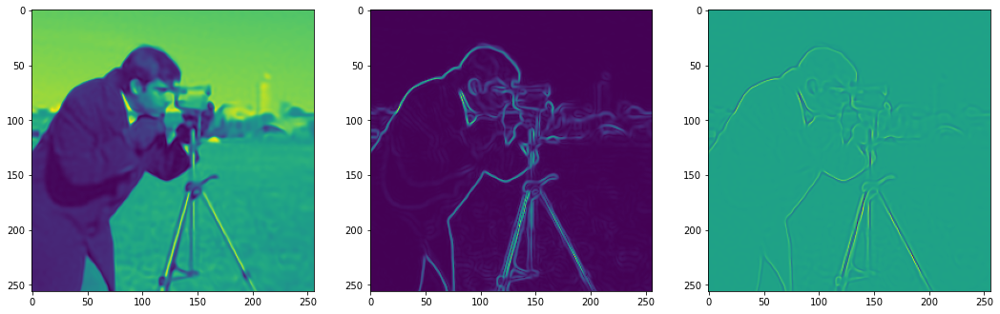

Step 370, Total loss 0.002342


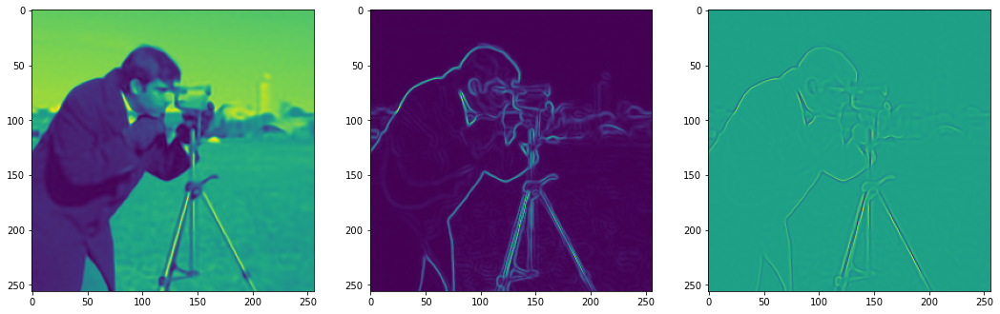

Step 380, Total loss 0.002301


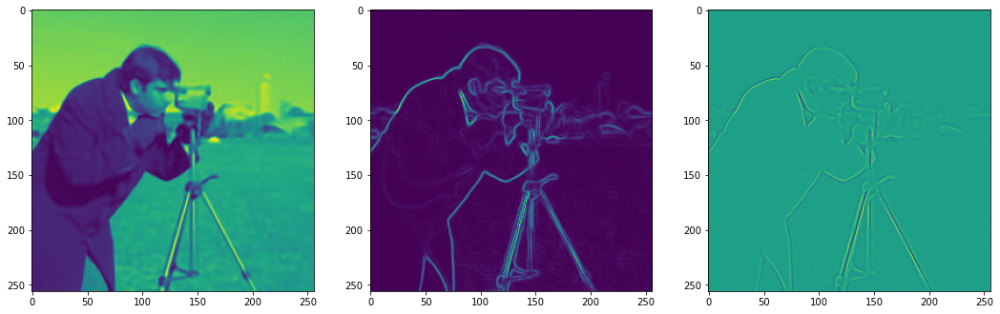

Step 390, Total loss 0.002263


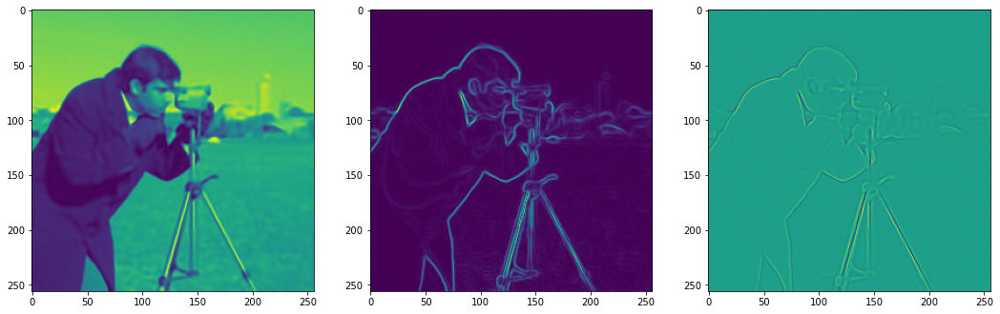

Step 400, Total loss 0.002229


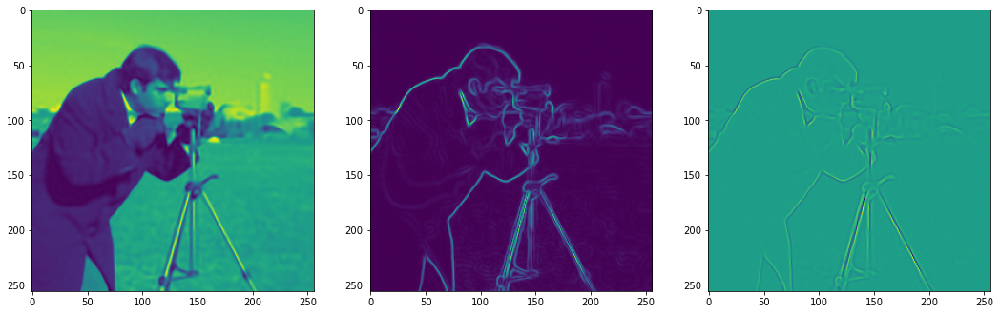

Step 410, Total loss 0.002198


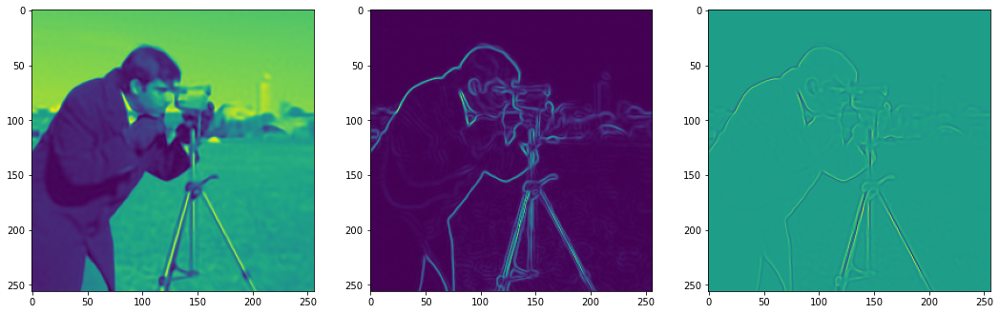

Step 420, Total loss 0.002171


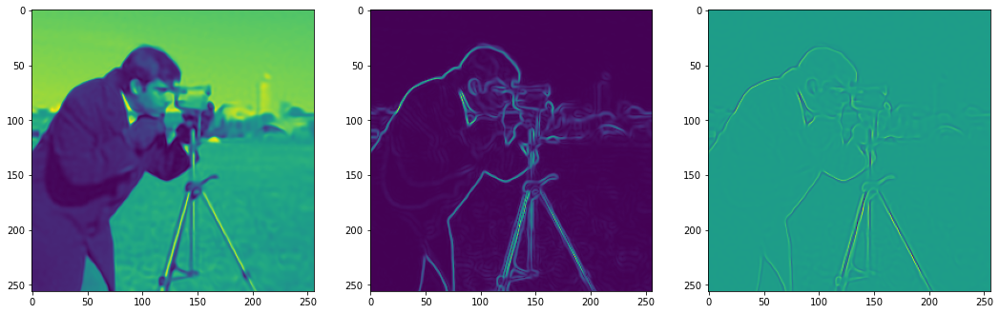

Step 430, Total loss 0.002145


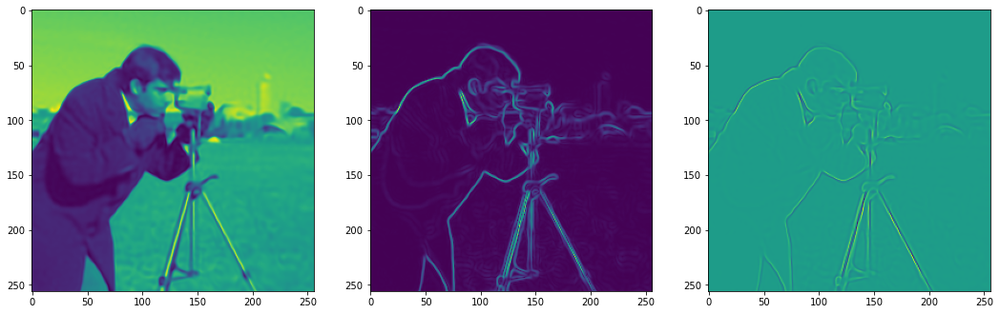

Step 440, Total loss 0.002123


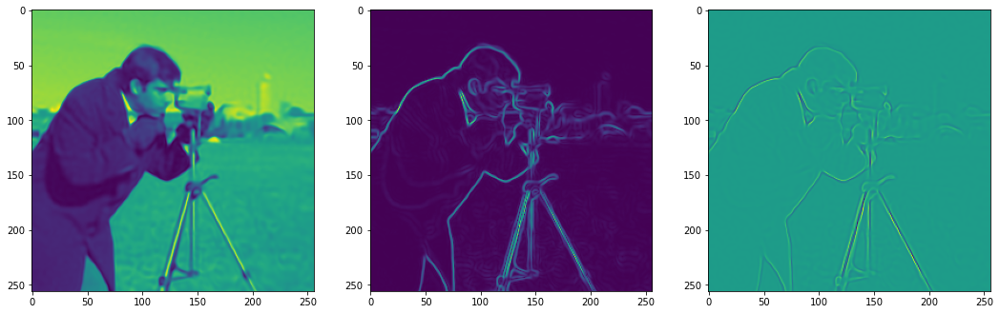

Step 450, Total loss 0.002101


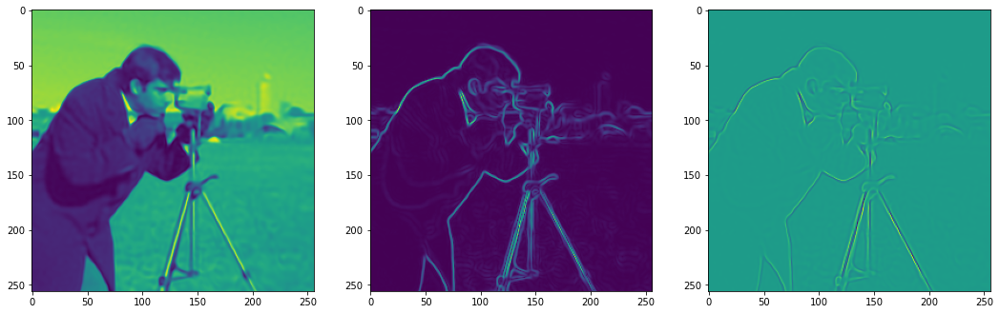

Step 460, Total loss 0.002082


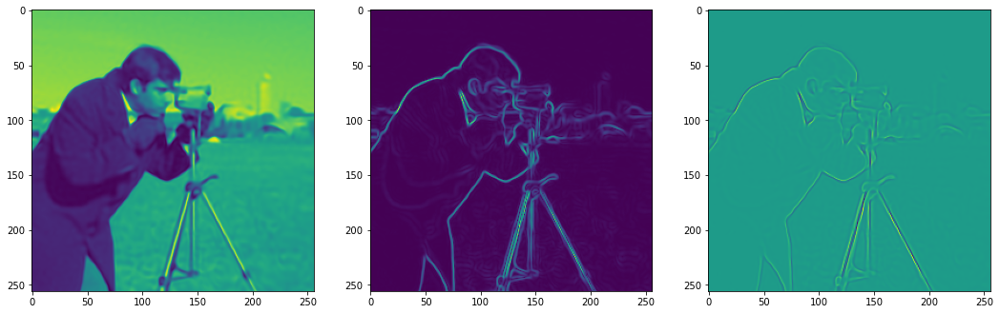

Step 470, Total loss 0.002064


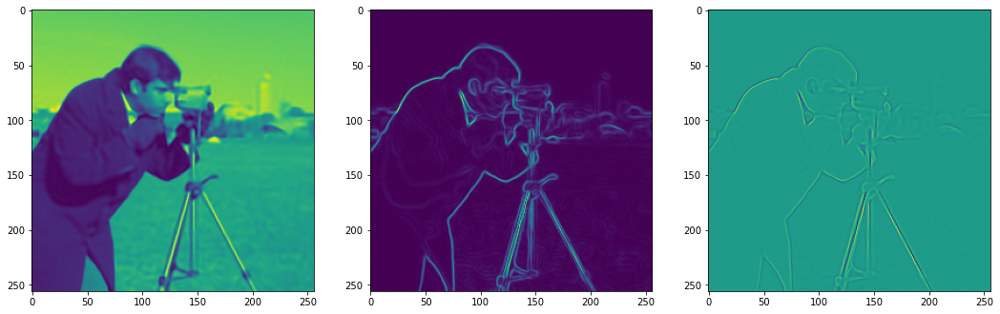

Step 480, Total loss 0.002047


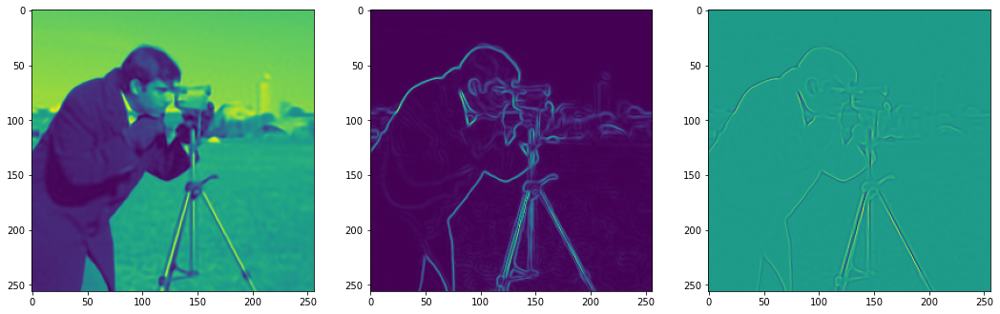

Step 490, Total loss 0.002030


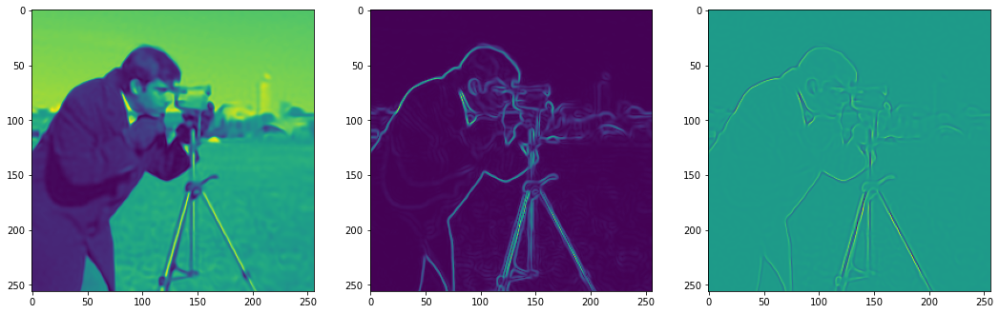

In [10]:
total_steps = 500
steps_til_summary = 10

optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=500, eta_min=0.00001)

model_input, ground_truth = next(iter(dataloader))
model_input, ground_truth = model_input.to(device), ground_truth.to(device)

for step in range(total_steps):
    model_output, coords = img_siren(model_input)    
    loss = ((model_output - ground_truth)**2).mean()
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f" % (step, loss))
        img_grad = gradient(model_output, coords)
        img_laplacian = laplace(model_output, coords)

        fig, axes = plt.subplots(1,3, figsize=(18,6))
        axes[0].imshow(model_output.cpu().view(256,256).detach().numpy())
        axes[1].imshow(img_grad.norm(dim=-1).cpu().view(256,256).detach().numpy())
        axes[2].imshow(img_laplacian.cpu().view(256,256).detach().numpy())
        plt.show()

    optim.zero_grad()
    loss.backward()
    optim.step()
    scheduler.step()

### 6. Performance Evaluation

In [14]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

# Function to calculate PSNR (Peak Signal-to-Noise Ratio)
def calculate_psnr(img1, img2):
    img1_np = img1.detach().cpu().numpy()
    img2_np = img2.detach().cpu().numpy()
    data_range = float(max(img1_np.max()-img1_np.min(), img2_np.max()-img2_np.min(), img1_np.max()-img2_np.min(), img2_np.max()-img1_np.min()))
    psnr_value = peak_signal_noise_ratio(img1_np, img2_np, data_range=data_range)
    return psnr_value

# Function to calculate SSIM (Structural Similarity Index)
def calculate_ssim(img1, img2):
    img1_np = img1.detach().cpu().numpy().reshape(256, 256)
    img2_np = img2.detach().cpu().numpy().reshape(256, 256)
    ssim_value = structural_similarity(img1_np, img2_np)
    return ssim_value

PSNR = 33.207dB, SSIM = 0.895


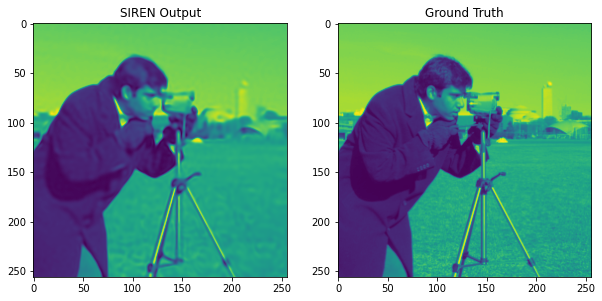

In [15]:
# Function to visualize evaluation
def visualize_evaluation(img1, img2):
    psnr_value = calculate_psnr(img1, img2)
    ssim_value = calculate_ssim(img1, img2)

    print(f"PSNR = {psnr_value:.3f}dB, SSIM = {ssim_value:.3f}")

    # Visualize images
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(img1.detach().cpu().numpy().reshape(256, 256))
    axes[0].set_title('SIREN Output')
    axes[1].imshow(img2.detach().cpu().numpy().reshape(256, 256))
    axes[1].set_title('Ground Truth')
    plt.show()
    
visualize_evaluation(model_output, ground_truth)

---

### Appendix) Learning Rate Graph

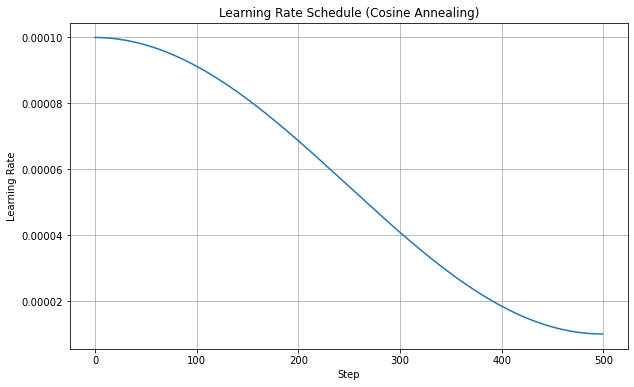

In [16]:
optim = torch.optim.Adam(lr=1e-4, params=img_siren.parameters())
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optim, T_max=500, eta_min=0.00001)

# Store the learning rate values
lrs = []

# 500 steps
for step in range(500):
    optim.step()  # Update the optimizer
    scheduler.step()  # Update the scheduler
    lrs.append(optim.param_groups[0]['lr'])

# Plot the learning rate over steps
plt.figure(figsize=(10, 6))
plt.plot(range(500), lrs)
plt.xlabel('Step')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule (Cosine Annealing)')
plt.grid(True)
plt.show()